In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import timedelta
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.datasets import load_iris
# import subprocess
import pyreadr
import math
import os

In [4]:
# # Date range
# file_name_date = '20211231'
start_date = pd.Timestamp('2020-01-22')
sev_start_date = pd.Timestamp("2020-10-01")
pre_date = pd.Timestamp('2021-08-20') # 예측 시작날짜
end_date = pd.Timestamp('2023-05-31') # 예측 끝 날짜
# # train_date = pd.date_range(start_date,pre_date-timedelta(days=1))
# train_date = pd.date_range(start_date,pre_date)

# predict_date = pd.date_range(pre_date,end_date) # 예측 날짜 범위
# date = pd.date_range(seir_start_date,end_date)

# Ground-Truth
###### (이유엔 데이터)

In [5]:
# 이유엔 데이터 경로
path_ = '../data/수집데이터_211013.xlsx'


In [6]:
### 확진자, 사망자
data_case= pd.read_excel(path_,engine = "openpyxl",sheet_name ='확진자,사망자수(US 제외)' )
data_case=data_case[data_case['Country'] =='South Korea']
data_case['tDate'] = pd.to_datetime(data_case['tDate'], format="%Y-%m-%d")
#df_= df_1_2.drop(['Province1','Province2','Unnamed: 6'], axis=1, inplace=True)
data_case.drop(['Province1','Province2'], axis=1, inplace=True)
data_case = data_case.fillna(0)
data_case.reset_index(drop=True, inplace=True)
# old_data= data_case[ data_case['tDate'].isin(train_date) ] #Confirmed, Deaths
# old_data = old_data.fillna(0)
# old_data

In [7]:
data_case

,tDate,Country,Confirmed,Deaths
0,2020-01-22,South Korea,0,0
1,2020-01-23,South Korea,0,0
2,2020-01-24,South Korea,1,0
3,2020-01-25,South Korea,0,0
4,2020-01-26,South Korea,1,0
...,...,...,...,...
615,2021-10-08,South Korea,2172,10
616,2021-10-09,South Korea,1949,6
617,2021-10-10,South Korea,1594,15
618,2021-10-11,South Korea,1297,8


In [8]:
data_case.loc[[3],['Deaths']].values

array([[0]])

In [9]:
### 누적 확진자
data_case['Cum_Deaths']=0.0
for i in range(1,len(data_case)):
    data_case.loc[[i],['Cum_Deaths']] = float(data_case.loc[[i],['Deaths']].values)+float(data_case.loc[[i-1],['Cum_Deaths']].values)
data_case

,tDate,Country,Confirmed,Deaths,Cum_Deaths
0,2020-01-22,South Korea,0,0,0.0
1,2020-01-23,South Korea,0,0,0.0
2,2020-01-24,South Korea,1,0,0.0
3,2020-01-25,South Korea,0,0,0.0
4,2020-01-26,South Korea,1,0,0.0
...,...,...,...,...,...
615,2021-10-08,South Korea,2172,10,2560.0
616,2021-10-09,South Korea,1949,6,2566.0
617,2021-10-10,South Korea,1594,15,2581.0
618,2021-10-11,South Korea,1297,8,2589.0


In [10]:
aug20_cum_deaths = float(data_case.loc[data_case['tDate']=='2021-08-20','Cum_Deaths'])
aug20_cum_deaths

2203.0

In [11]:
### 중증자
old_severity= pd.read_excel(path_, engine = "openpyxl",usecols='A,H',sheet_name ='확진자 관리현황')
old_severity.columns = ['tDate','Severity']
old_severity['tDate'] = pd.to_datetime(old_severity['tDate'], format="%Y-%m-%d")
old_severity = old_severity.fillna(0)
old_severity

,tDate,Severity
0,2020-10-01,107
1,2020-10-02,107
2,2020-10-03,104
3,2020-10-04,105
4,2020-10-05,107
...,...,...
359,2021-09-25,339
360,2021-09-26,320
361,2021-09-27,319
362,2021-09-28,324


# Result csv

In [12]:
Rt = [2.5, 2.75, 3.0, 3.5, 4.5]

In [13]:
final_list = pd.read_csv('../result/csv/final_list.csv')
final_list = final_list.drop(['Unnamed: 0'],axis=1)
final_list['date'] = pd.to_datetime(final_list['date'], format="%Y-%m-%d")
final_list = final_list[final_list['date']>=pre_date] ##예측 시작날짜 이전 데이터 잘라냄.

final_list

,V1,V2,V3,V4,t,date,case,V1.1,V2.1,V3.1,...,min_death.12,max_death.12,date.88,t.88,min_death.13,max_death.13,date.89,t.89,min_death.14,max_death.14
18,209.978883,625.848154,584.600192,123.007997,18,2021-08-20,1543.435226,209.978883,625.848154,584.600192,...,74.475385,75.419424,2021-08-20,18,74.475385,75.419424,2021-08-20,18,74.475385,75.419424
19,213.298966,635.024650,589.577163,125.222154,19,2021-08-21,1563.122933,213.298966,635.024650,589.577163,...,80.106070,81.226211,2021-08-21,19,80.106070,81.226211,2021-08-21,19,80.106070,81.226211
20,216.373805,642.525372,593.086465,127.112995,20,2021-08-22,1579.098637,216.373805,642.525372,593.086465,...,85.718139,87.032151,2021-08-22,20,85.718139,87.032151,2021-08-22,20,85.718139,87.032151
21,219.244481,647.977880,595.689157,128.780412,21,2021-08-23,1591.691931,219.244481,647.977880,595.689157,...,91.305462,92.831325,2021-08-23,21,91.305462,92.831325,2021-08-23,21,91.305462,92.831325
22,221.589194,652.335856,596.614052,130.308877,22,2021-08-24,1600.847979,221.589194,652.335856,596.614052,...,96.863263,98.619065,2021-08-24,22,96.863263,98.619065,2021-08-24,22,96.863263,98.619065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,5.832478,9.578420,9.975349,5.230529,663,2023-05-27,30.616776,26.088443,41.914583,44.093275,...,64051.602453,66572.922228,2023-05-27,663,63946.083531,66466.918603,2023-05-27,663,63832.048972,66351.887734
664,5.823617,9.561553,9.956989,5.222578,664,2023-05-28,30.564737,26.013274,41.809117,43.979410,...,64051.602457,66572.922231,2023-05-28,664,63946.083532,66466.918604,2023-05-28,664,63832.048973,66351.887735
665,5.814768,9.544715,9.938660,5.214639,665,2023-05-29,30.512783,25.938301,41.703885,43.856298,...,64051.602460,66572.922233,2023-05-29,665,63946.083532,66466.918604,2023-05-29,665,63832.048973,66351.887735
666,5.805932,9.527905,9.920364,5.206712,666,2023-05-30,30.460913,25.863524,41.598887,43.728413,...,64051.602463,66572.922236,2023-05-30,666,63946.083533,66466.918605,2023-05-30,666,63832.048973,66351.887735


In [14]:
final_list.columns

Index(['V1', 'V2', 'V3', 'V4', 't', 'date', 'case', 'V1.1', 'V2.1', 'V3.1',
       ...
       'min_death.12', 'max_death.12', 'date.88', 't.88', 'min_death.13',
       'max_death.13', 'date.89', 't.89', 'min_death.14', 'max_death.14'],
      dtype='object', length=495)

## Rt 값에 따라 case, serve, death 데이터프레임 생성
### plot에 불필요한 columns 제거

In [15]:
cnt = 0

In [16]:
incidence = pd.DataFrame({'Date': final_list['date']})
severity = pd.DataFrame({'Date': final_list['date']})
deaths = pd.DataFrame({'Date': final_list['date']})

In [17]:
incidence['Date']

18    2021-08-20
19    2021-08-21
20    2021-08-22
21    2021-08-23
22    2021-08-24
         ...    
663   2023-05-27
664   2023-05-28
665   2023-05-29
666   2023-05-30
667   2023-05-31
Name: Date, Length: 650, dtype: datetime64[ns]

In [18]:
for rt in Rt:
    if rt == Rt[0]:
        rt_0_case = final_list.iloc[:,cnt:cnt+33]
        rt_0_case = rt_0_case.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_0_case.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_0_case['Date'] = pd.to_datetime(rt_0_case['Date'], format="%Y-%m-%d")
        ## incidence 에 추가
        incidence = pd.merge(incidence,rt_0_case, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_0_serve = final_list.iloc[:,cnt:cnt+33]
        rt_0_serve = rt_0_serve.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_0_serve.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_0_serve['Date'] = pd.to_datetime(rt_0_serve['Date'], format="%Y-%m-%d")
        ## severity 에 추가
        severity = pd.merge(severity,rt_0_serve, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_0_death = final_list.iloc[:,cnt:cnt+33]
        rt_0_death = rt_0_death.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_0_death.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_0_death['Date'] = pd.to_datetime(rt_0_death['Date'], format="%Y-%m-%d")
        ## deaths 에 추가
        deaths = pd.merge(deaths,rt_0_death, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
    elif rt == Rt[1]:
        rt_1_case = final_list.iloc[:,cnt:cnt+33]
        rt_1_case = rt_1_case.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_1_case.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_1_case['Date'] = pd.to_datetime(rt_1_case['Date'], format="%Y-%m-%d")
        ## incidence 에 추가
        incidence = pd.merge(incidence,rt_1_case, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_1_serve = final_list.iloc[:,cnt:cnt+33]
        rt_1_serve = rt_1_serve.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_1_serve.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_1_serve['Date'] = pd.to_datetime(rt_1_serve['Date'], format="%Y-%m-%d")
        ## severity 에 추가
        severity = pd.merge(severity,rt_1_serve, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_1_death = final_list.iloc[:,cnt:cnt+33]
        rt_1_death = rt_1_death.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_1_death.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_1_death['Date'] = pd.to_datetime(rt_1_death['Date'], format="%Y-%m-%d")
        ## deaths 에 추가
        deaths = pd.merge(deaths,rt_1_death, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
    elif rt == Rt[2]:
        rt_2_case = final_list.iloc[:,cnt:cnt+33]
        rt_2_case = rt_2_case.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_2_case.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_2_case['Date'] = pd.to_datetime(rt_2_case['Date'], format="%Y-%m-%d")
        ## incidence 에 추가
        incidence = pd.merge(incidence,rt_2_case, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_2_serve = final_list.iloc[:,cnt:cnt+33]
        rt_2_serve = rt_2_serve.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_2_serve.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_2_serve['Date'] = pd.to_datetime(rt_2_serve['Date'], format="%Y-%m-%d")
        ## severity 에 추가
        severity = pd.merge(severity,rt_2_serve, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_2_death = final_list.iloc[:,cnt:cnt+33]
        rt_2_death = rt_2_death.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_2_death.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_2_death['Date'] = pd.to_datetime(rt_2_death['Date'], format="%Y-%m-%d")
        ## deaths 에 추가
        deaths = pd.merge(deaths,rt_2_death, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
    elif rt == Rt[3]:
        rt_3_case = final_list.iloc[:,cnt:cnt+33]
        rt_3_case = rt_3_case.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_3_case.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_3_case['Date'] = pd.to_datetime(rt_3_case['Date'], format="%Y-%m-%d")
        ## incidence 에 추가
        incidence = pd.merge(incidence,rt_3_case, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_3_serve = final_list.iloc[:,cnt:cnt+33]
        rt_3_serve = rt_3_serve.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_3_serve.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_3_serve['Date'] = pd.to_datetime(rt_3_serve['Date'], format="%Y-%m-%d")
        ## severity 에 추가
        severity = pd.merge(severity,rt_3_serve, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_3_death = final_list.iloc[:,cnt:cnt+33]
        rt_3_death = rt_3_death.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_3_death.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_3_death['Date'] = pd.to_datetime(rt_3_death['Date'], format="%Y-%m-%d")
        ## deaths 에 추가
        deaths = pd.merge(deaths,rt_3_death, how='left', left_on='Date', right_on='Date')
        cnt += 33
    else:
        rt_4_case = final_list.iloc[:,cnt:cnt+33]
        rt_4_case = rt_4_case.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_4_case.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_4_case['Date'] = pd.to_datetime(rt_4_case['Date'], format="%Y-%m-%d")
        ## incidence 에 추가
        incidence = pd.merge(incidence,rt_4_case, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_4_serve = final_list.iloc[:,cnt:cnt+33]
        rt_4_serve = rt_4_serve.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_4_serve.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_4_serve['Date'] = pd.to_datetime(rt_4_serve['Date'], format="%Y-%m-%d")
        ## severity 에 추가
        severity = pd.merge(severity,rt_4_serve, how='left', left_on='Date', right_on='Date')
        cnt += 33
        
        rt_4_death = final_list.iloc[:,cnt:cnt+33]
        rt_4_death = rt_4_death.iloc[:,[5,6,13,20,23,24,27,28,31,32]]
        rt_4_death.columns = ['Date', str(rt)+'_h',str(rt)+'_b',str(rt)+'_l',str(rt)+'_h_min',str(rt)+'_h_max',str(rt)+'_b_min',str(rt)+'_b_max',str(rt)+'_l_min',str(rt)+'_l_max']
        rt_4_death['Date'] = pd.to_datetime(rt_4_death['Date'], format="%Y-%m-%d")
        ## deaths 에 추가
        deaths = pd.merge(deaths,rt_4_death, how='left', left_on='Date', right_on='Date')
        cnt += 33

In [19]:
rt_0_case

,Date,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max
18,2021-08-20,1543.435226,1543.435226,1543.435226,1474.295410,1624.920005,1474.295410,1624.920005,1474.295410,1624.920005
19,2021-08-21,1563.122933,1563.122933,1563.122933,1490.354135,1649.273319,1490.354135,1649.273319,1490.354135,1649.273319
20,2021-08-22,1579.098637,1579.098637,1579.098637,1502.433672,1669.530761,1502.433672,1669.530761,1502.433672,1669.530761
21,2021-08-23,1591.691931,1591.691931,1591.691931,1511.053041,1686.250123,1511.053041,1686.250123,1511.053041,1686.250123
22,2021-08-24,1600.847979,1600.847979,1600.847979,1516.746720,1700.100459,1516.746720,1700.100459,1516.746720,1700.100459
...,...,...,...,...,...,...,...,...,...,...
663,2023-05-27,30.616776,135.232070,196.037660,14.340799,55.318139,70.201317,228.711321,116.021911,310.518851
664,2023-05-28,30.564737,134.877879,195.173021,14.304688,55.264506,69.966049,228.237819,115.450445,309.498681
665,2023-05-29,30.512783,134.515009,194.340220,14.268668,55.210907,69.731547,227.764995,114.881735,308.481315
666,2023-05-30,30.460913,134.147931,193.524100,14.232737,55.157342,69.497807,227.292851,114.315768,307.466747


In [20]:
incidence

,Date,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,...,3.5_l_max,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max
0,2021-08-20,1543.435226,1543.435226,1543.435226,1474.295410,1624.920005,1474.295410,1624.920005,1474.295410,1624.920005,...,1624.920005,1543.435226,1.543435e+03,1.543435e+03,1474.295410,1624.920005,1.474295e+03,1624.920005,1.474295e+03,1.624920e+03
1,2021-08-21,1563.122933,1563.122933,1563.122933,1490.354135,1649.273319,1490.354135,1649.273319,1490.354135,1649.273319,...,1649.273319,1563.122933,1.563123e+03,1.563123e+03,1490.354135,1649.273319,1.490354e+03,1649.273319,1.490354e+03,1.649273e+03
2,2021-08-22,1579.098637,1579.098637,1579.098637,1502.433672,1669.530761,1502.433672,1669.530761,1502.433672,1669.530761,...,1669.530761,1579.098637,1.579099e+03,1.579099e+03,1502.433672,1669.530761,1.502434e+03,1669.530761,1.502434e+03,1.669531e+03
3,2021-08-23,1591.691931,1591.691931,1591.691931,1511.053041,1686.250123,1511.053041,1686.250123,1511.053041,1686.250123,...,1686.250123,1591.691931,1.591692e+03,1.591692e+03,1511.053041,1686.250123,1.511053e+03,1686.250123,1.511053e+03,1.686250e+03
4,2021-08-24,1600.847979,1600.847979,1600.847979,1516.746720,1700.100459,1516.746720,1700.100459,1516.746720,1700.100459,...,1700.100459,1600.847979,1.600848e+03,1.600848e+03,1516.746720,1700.100459,1.516747e+03,1700.100459,1.516747e+03,1.700100e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,2023-05-27,30.616776,135.232070,196.037660,14.340799,55.318139,70.201317,228.711321,116.021911,310.518851,...,0.490840,0.000003,6.928428e-07,3.043108e-07,0.000002,0.000007,3.403313e-07,0.000002,1.531598e-07,6.684015e-07
646,2023-05-28,30.564737,134.877879,195.173021,14.304688,55.264506,69.966049,228.237819,115.450445,309.498681,...,0.474135,0.000003,6.508238e-07,2.861358e-07,0.000002,0.000007,3.198082e-07,0.000001,1.441476e-07,6.285910e-07
647,2023-05-29,30.512783,134.515009,194.340220,14.268668,55.210907,69.731547,227.764995,114.881735,308.481315,...,0.457998,0.000003,6.113860e-07,2.690668e-07,0.000001,0.000007,3.005520e-07,0.000001,1.356837e-07,5.911757e-07
648,2023-05-30,30.460913,134.147931,193.524100,14.232737,55.157342,69.497807,227.292851,114.315768,307.466747,...,0.442411,0.000003,5.743702e-07,2.530343e-07,0.000001,0.000006,2.824824e-07,0.000001,1.277328e-07,5.560102e-07


In [21]:
severity

,Date,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,...,3.5_l_max,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max
0,2021-08-20,178.311178,178.311178,178.311178,174.956875,181.931595,174.956875,181.931595,174.956875,181.931595,...,181.931595,178.311178,178.311178,178.311178,174.956875,181.931595,174.956875,181.931595,174.956875,181.931595
1,2021-08-21,180.510915,180.510915,180.510915,176.827745,184.533145,176.827745,184.533145,176.827745,184.533145,...,184.533145,180.510915,180.510915,180.510915,176.827745,184.533145,176.827745,184.533145,176.827745,184.533145
2,2021-08-22,182.454478,182.454478,182.454478,178.443165,186.892732,178.443165,186.892732,178.443165,186.892732,...,186.892732,182.454478,182.454478,182.454478,178.443165,186.892732,178.443165,186.892732,178.443165,186.892732
3,2021-08-23,184.166794,184.166794,184.166794,179.830682,189.033874,179.830682,189.033874,179.830682,189.033874,...,189.033874,184.166794,184.166794,184.166794,179.830682,189.033874,179.830682,189.033874,179.830682,189.033874
4,2021-08-24,185.670642,185.670642,185.670642,181.011918,190.975694,181.011918,190.975694,181.011918,190.975694,...,190.975694,185.670642,185.670642,185.670642,181.011918,190.975694,181.011918,190.975694,181.011918,190.975694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,2023-05-27,4.069767,18.381310,27.738789,1.992271,7.291751,9.905088,30.939866,16.740847,42.400137,...,0.176815,0.000084,0.000020,0.000009,0.000058,0.000124,0.000014,0.000029,0.000006,0.000013
646,2023-05-28,4.062862,18.328981,27.616799,1.987373,7.284745,9.871228,30.876391,16.658998,42.266756,...,0.170855,0.000079,0.000019,0.000009,0.000054,0.000118,0.000013,0.000028,0.000006,0.000013
647,2023-05-29,4.055967,18.276786,27.496103,1.982488,7.277742,9.837479,30.813004,16.577539,42.133708,...,0.165095,0.000075,0.000018,0.000008,0.000051,0.000111,0.000012,0.000026,0.000006,0.000012
648,2023-05-30,4.049084,18.224724,27.375946,1.977615,7.270744,9.803842,30.749704,16.496468,42.000994,...,0.159529,0.000071,0.000017,0.000008,0.000049,0.000105,0.000012,0.000025,0.000005,0.000011


In [22]:
deaths

,Date,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,...,3.5_l_max,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max
0,2021-08-20,74.941860,74.941860,74.941860,74.475385,75.419424,74.475385,75.419424,74.475385,75.419424,...,75.419424,74.941860,74.941860,74.941860,74.475385,75.419424,74.475385,75.419424,74.475385,75.419424
1,2021-08-21,80.655132,80.655132,80.655132,80.106070,81.226211,80.106070,81.226211,80.106070,81.226211,...,81.226211,80.655132,80.655132,80.655132,80.106070,81.226211,80.106070,81.226211,80.106070,81.226211
2,2021-08-22,86.355133,86.355133,86.355133,85.718139,87.032151,85.718139,87.032151,85.718139,87.032151,...,87.032151,86.355133,86.355133,86.355133,85.718139,87.032151,85.718139,87.032151,85.718139,87.032151
3,2021-08-23,92.044911,92.044911,92.044911,91.305462,92.831325,91.305462,92.831325,91.305462,92.831325,...,92.831325,92.044911,92.044911,92.044911,91.305462,92.831325,91.305462,92.831325,91.305462,92.831325
4,2021-08-24,97.719949,97.719949,97.719949,96.863263,98.619065,96.863263,98.619065,96.863263,98.619065,...,98.619065,97.719949,97.719949,97.719949,96.863263,98.619065,96.863263,98.619065,96.863263,98.619065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,2023-05-27,521.176074,1206.925952,2283.068936,465.105857,603.287538,960.907560,1575.991005,1770.732704,3012.095676,...,44193.802758,65404.541451,65296.869676,65171.706711,64051.602453,66572.922228,63946.083531,66466.918603,63832.048972,66351.887734
646,2023-05-28,521.306780,1207.435021,2284.296509,465.186232,603.503251,961.250217,1577.048845,1771.338643,3013.459220,...,44193.805400,65404.541454,65296.869677,65171.706711,64051.602457,66572.922231,63946.083532,66466.918604,63832.048973,66351.887735
647,2023-05-29,521.437270,1207.942508,2285.519682,465.266444,603.720455,961.591767,1578.104160,1771.941896,3014.816686,...,44193.807949,65404.541457,65296.869677,65171.706711,64051.602460,66572.922233,63946.083532,66466.918604,63832.048973,66351.887735
648,2023-05-30,521.567544,1208.448418,2286.738469,465.346495,603.937374,961.932215,1579.156956,1772.542474,3016.168097,...,44193.810406,65404.541460,65296.869678,65171.706712,64051.602463,66572.922236,63946.083533,66466.918605,63832.048973,66351.887735


# original plot

In [23]:
## original plot

def Original_Plot(x,y,rt):
    file_name = 'rt '+str(rt)+' - '+x
    if x == 'incidence':
        ground_truth = data_case
        column = 'Confirmed'
        plt_start_date = start_date
        offset = 0
        if rt == Rt[0]:
            y_lim = [-100,3500]
        if rt == Rt[1]:
            y_lim = [-100,12000]
        if rt == Rt[2]:
            y_lim = [-100,35000]
        if rt == Rt[3]:
            y_lim = [-100,100000]
        if rt == Rt[4]:
            y_lim = [-100,250000]
        
    elif x == 'deaths':
        ground_truth = data_case
        column = 'Cum_Deaths'
        plt_start_date = start_date
        offset = aug20_cum_deaths
        if rt == Rt[0]:
            y_lim = [-100,6800]
        if rt == Rt[1]:
            y_lim = [-100,21000]
        if rt == Rt[2]:
            y_lim = [-100,38000]
        if rt == Rt[3]:
            y_lim = [-100,63000]
        if rt == Rt[4]:
            y_lim = [-100,93000]

    else:
        ground_truth = old_severity
        column = 'Severity'
        plt_start_date = sev_start_date
        offset = 0
        if rt == Rt[0]:
            y_lim = [-100,500]
        if rt == Rt[1]:
            y_lim = [-100,1500]
        if rt == Rt[2]:
            y_lim = [-100,5000]
        if rt == Rt[3]:
            y_lim = [-100,13000]
        if rt == Rt[4]:
            y_lim = [-100,30000]

        


    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    plt.ylim(y_lim)
    #############################################################
   

    ################ Ground Truth #######################################
    plt.plot(ground_truth['tDate'], ground_truth[column],color = '#2dcafd',  linewidth = 6)

    ################ npi low Data #######################################
    plt.plot(y['Date'], y[str(rt)+'_l']+offset, color ='#f68960', linewidth = 8)
    plt.fill_between(y['Date'], y[str(rt)+'_l_min']+offset,y[str(rt)+'_l_max']+offset, color = '#f68960',alpha=0.2)
    
    
    ################ npi Base Data #######################################
    plt.plot(y['Date'], y[str(rt)+'_b']+offset, color ='#f56be4', linewidth = 8)
    plt.fill_between(y['Date'], y[str(rt)+'_b_min']+offset,y[str(rt)+'_b_max']+offset, color = '#f56be4',alpha=0.2)
    
    
    ################ npi high Data #######################################
    plt.plot(y['Date'], y[str(rt)+'_h']+offset, color ='#09d0a2', linewidth = 8)
    plt.fill_between(y['Date'], y[str(rt)+'_h_min']+offset,y[str(rt)+'_h_max']+offset, color = '#09d0a2',alpha=0.2)

    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth','Rt Counter 10%','Rt counter 20%','Rt counter 30%'],fontsize = 30,loc = 'upper left', edgecolor = 'w')


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
    plt.title('Rt '+str(rt)+x,fontsize=50)
#     plt.suptitle(file_name, y=1, fontsize=30)
    plt.xticks([plt_start_date,pre_date,end_date],[str(plt_start_date)[:10],str(pre_date)[:10],str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
#     plt.savefig("../figures/I/"+file_name+".png",dpi=300)
    plt.show()

In [24]:
data_case = data_case[data_case['tDate']<=pre_date]
old_severity = old_severity[old_severity['tDate']<=pre_date]

### 확진자

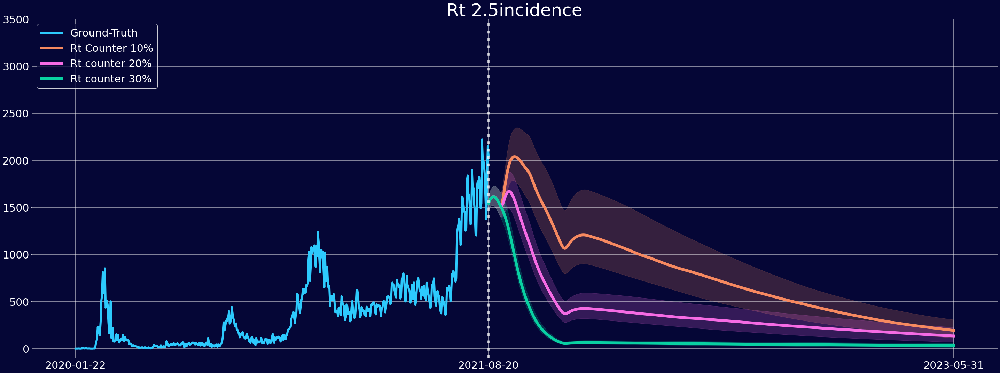

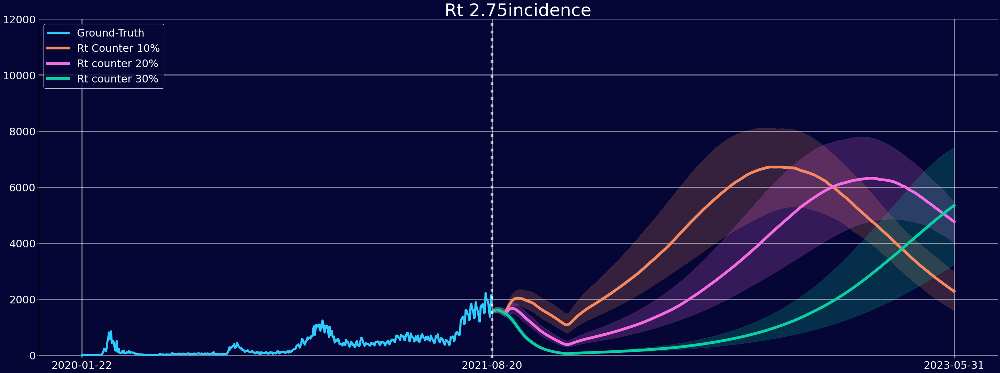

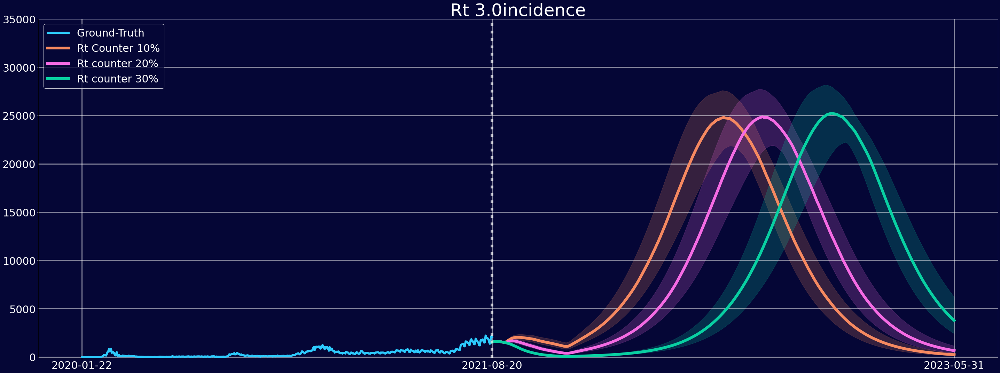

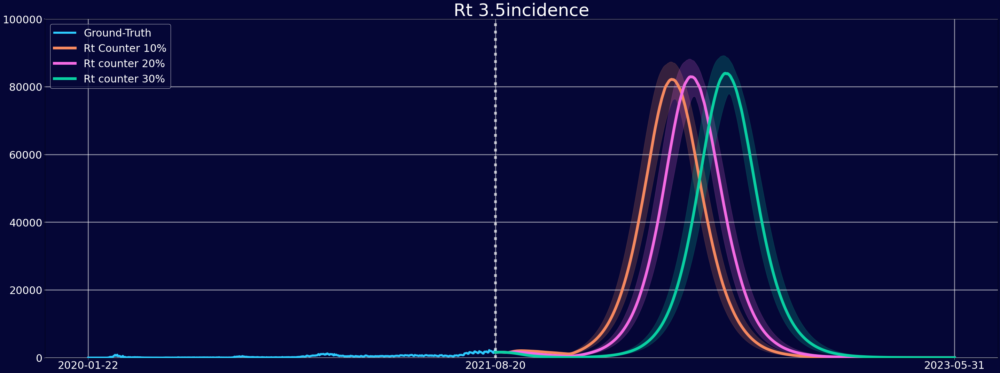

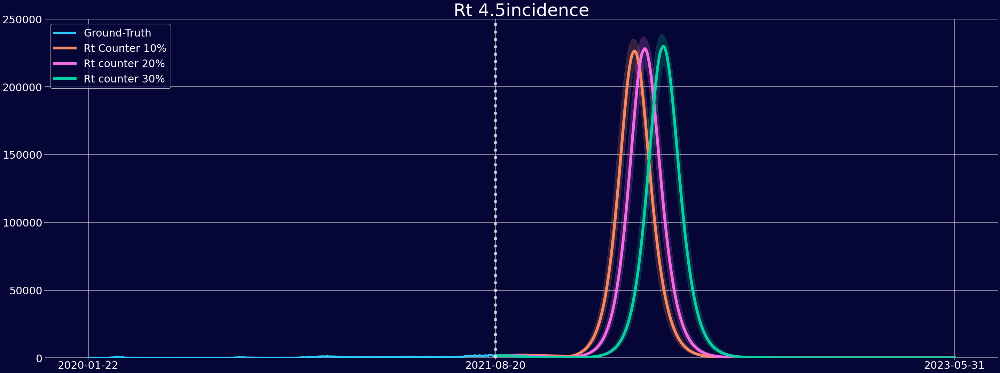

In [25]:
# rt_0_case = rt_0_case[rt_0_case['Date']>=pre_date]
# rt_1_case = rt_1_case[rt_1_case['Date']>=pre_date]
# rt_2_case = rt_2_case[rt_2_case['Date']>=pre_date]
# rt_3_case = rt_3_case[rt_3_case['Date']>=pre_date]
# rt_4_case = rt_4_case[rt_4_case['Date']>=pre_date]
Original_Plot('incidence',rt_0_case,Rt[0])
Original_Plot('incidence',rt_1_case,Rt[1])
Original_Plot('incidence',rt_2_case,Rt[2])
Original_Plot('incidence',rt_3_case,Rt[3])
Original_Plot('incidence',rt_4_case,Rt[4])

### 중증자

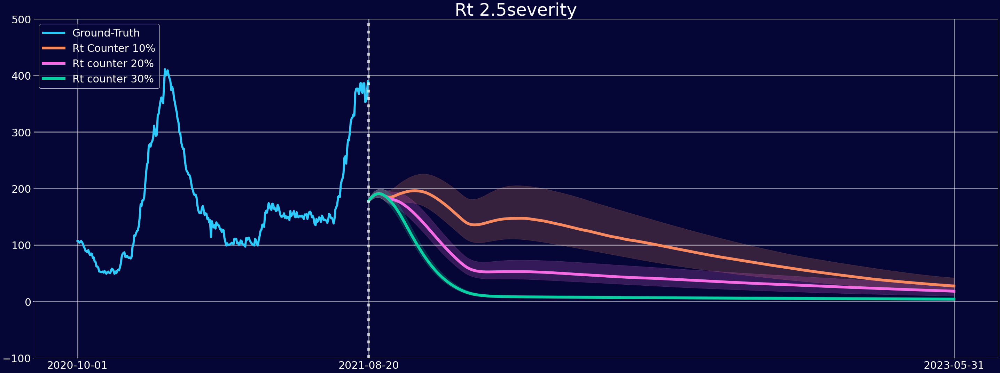

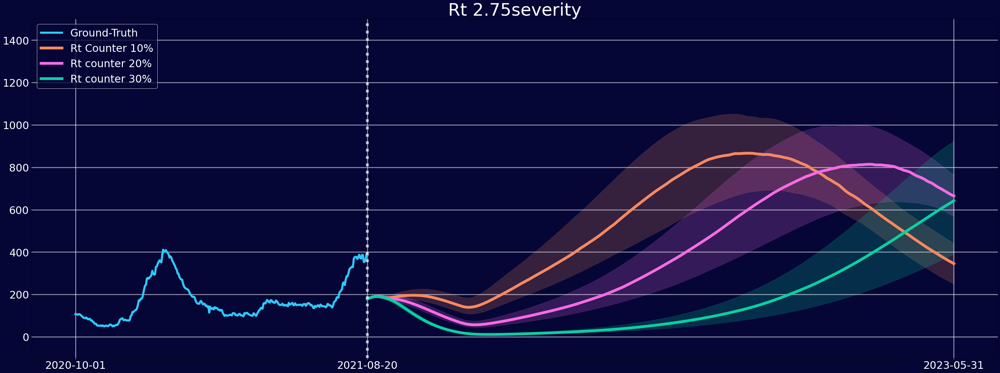

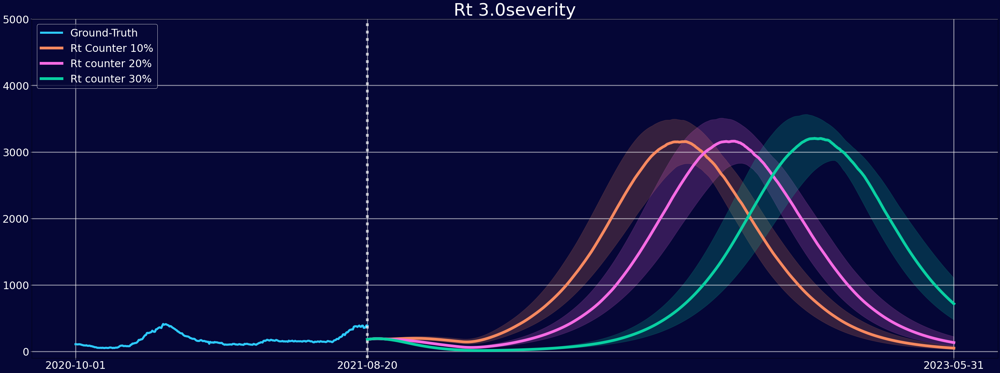

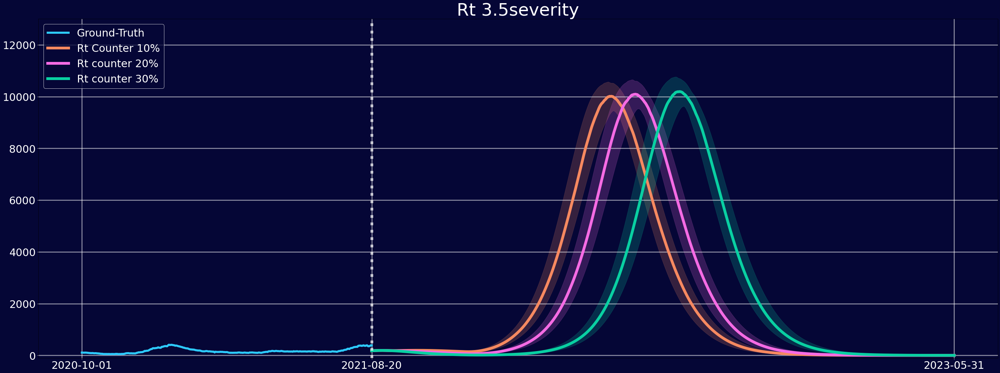

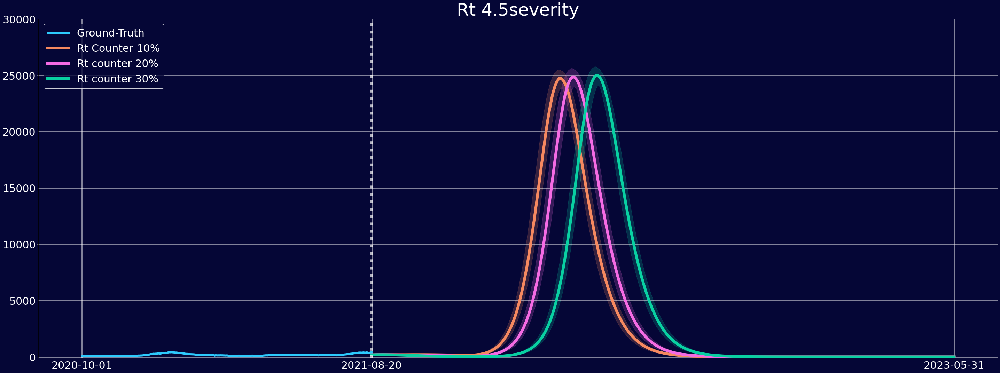

In [26]:
# rt_0_serve = rt_0_serve[rt_0_serve['Date']>=pre_date]
# rt_1_serve = rt_1_serve[rt_1_serve['Date']>=pre_date]
# rt_2_serve = rt_2_serve[rt_2_serve['Date']>=pre_date]
# rt_3_serve = rt_3_serve[rt_3_serve['Date']>=pre_date]
# rt_4_serve = rt_4_serve[rt_4_serve['Date']>=pre_date]
Original_Plot('severity',rt_0_serve,Rt[0])
Original_Plot('severity',rt_1_serve,Rt[1])
Original_Plot('severity',rt_2_serve,Rt[2])
Original_Plot('severity',rt_3_serve,Rt[3])
Original_Plot('severity',rt_4_serve,Rt[4])

### 사망자

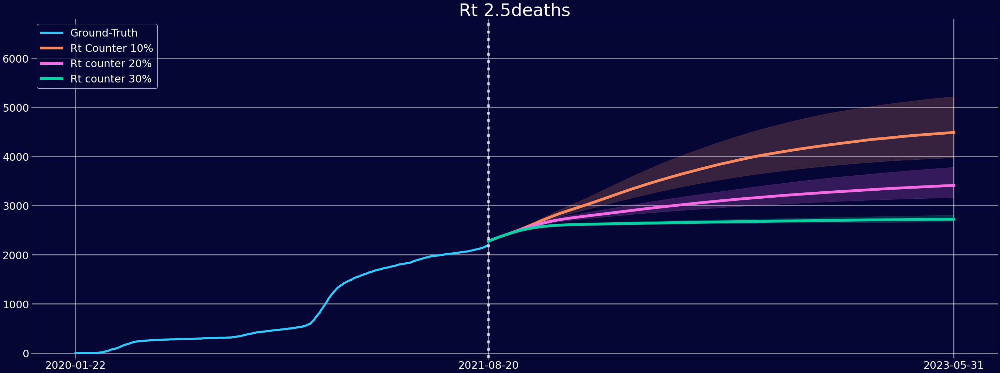

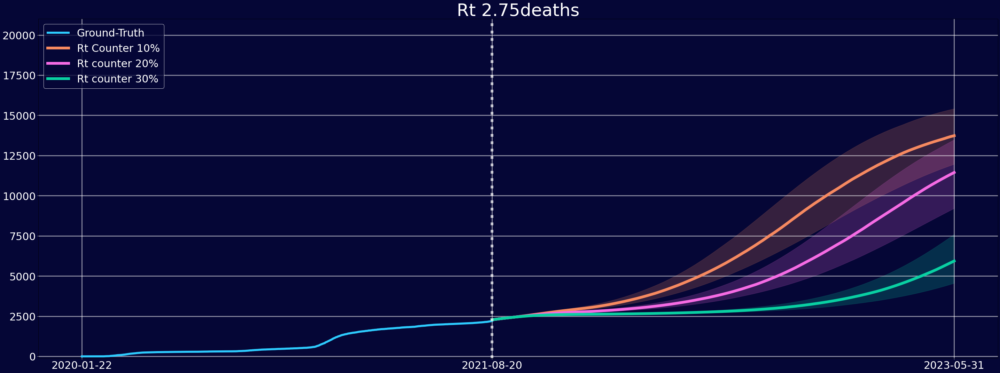

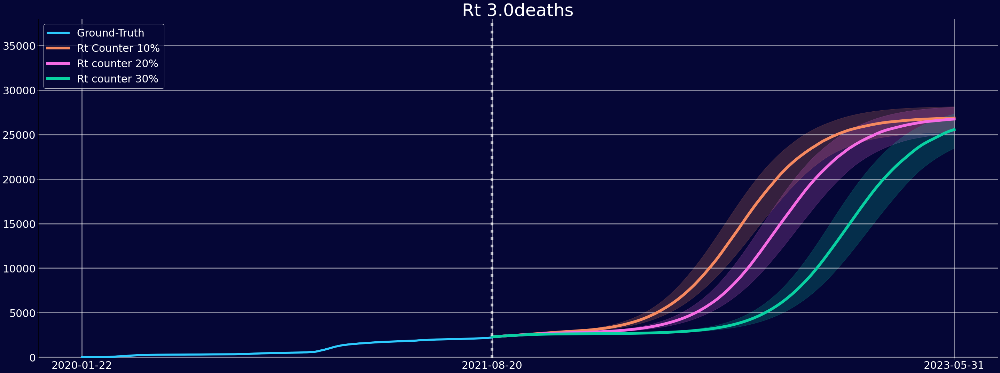

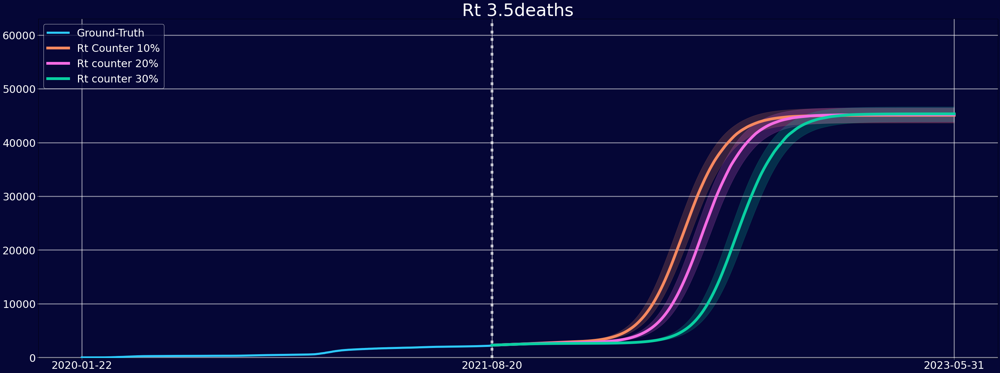

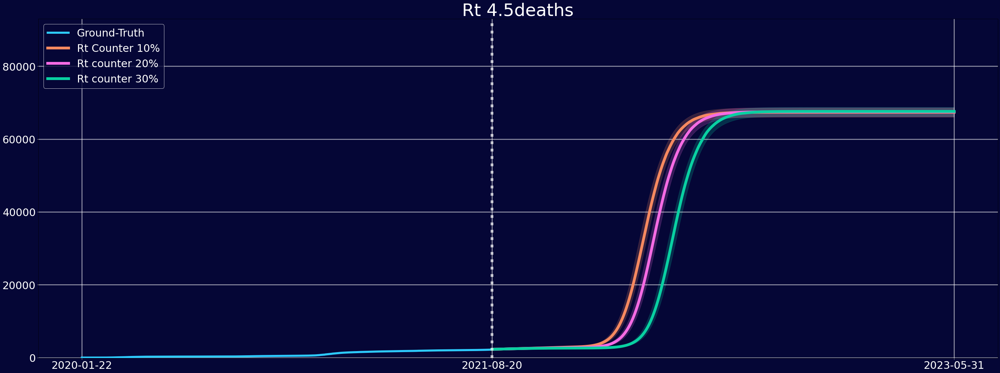

In [27]:
# rt_0_death = rt_0_death[rt_0_death['Date']>=pre_date]
# rt_1_death = rt_1_death[rt_1_death['Date']>=pre_date]
# rt_2_death = rt_2_death[rt_2_death['Date']>=pre_date]
# rt_3_death = rt_3_death[rt_3_death['Date']>=pre_date]
# rt_4_death = rt_4_death[rt_4_death['Date']>=pre_date]
Original_Plot('deaths',rt_0_death,Rt[0])
Original_Plot('deaths',rt_1_death,Rt[1])
Original_Plot('deaths',rt_2_death,Rt[2])
Original_Plot('deaths',rt_3_death,Rt[3])
Original_Plot('deaths',rt_4_death,Rt[4])

# 모든 Rt plot (new)

In [56]:
## Rt plot
def Rt_Plot(x,y,value):
    v = ''
    if value =='Low':
        v = 'l'
    elif value == 'Base':
        v = 'b'
    else:
        v = 'h'
    
    if x == 'incidence':
        ground_truth = data_case
        column = 'Confirmed'
        plt_start_date = start_date
        offset = 0
        folder = 'I'
        
    elif x == 'deaths':
        ground_truth = data_case
        column = 'Cum_Deaths'
        plt_start_date = start_date
        offset = aug20_cum_deaths
        folder = 'D'
    else:
        ground_truth = old_severity
        column = 'Severity'
        plt_start_date = sev_start_date
        offset = 0
        folder = 'S'

    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
#     plt.ylim(y_lim)
    #############################################################
   
    
    ################ Ground Truth #######################################
    plt.plot(ground_truth['tDate'], ground_truth[column],color = '#2dcafd',  linewidth = 6)
   
    
    ################ Rt[4] Data #######################################
    plt.plot(y['Date'], y[str(Rt[4])+'_'+v]+offset, color ='#7d72cf', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[4])+'_'+v+'_min']+offset,y[str(Rt[4])+'_'+v+'_max']+offset, color = '#7d72cf',alpha=0.3)

    
    ################ Rt[3] Data #######################################
    plt.plot(y['Date'], y[str(Rt[3])+'_'+v]+offset, color ='#3d77b6', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[3])+'_'+v+'_min']+offset,y[str(Rt[3])+'_'+v+'_max']+offset, color = '#3d77b6',alpha=0.3)
    
    
    ################ Rt[2] Data #######################################
    plt.plot(y['Date'], y[str(Rt[2])+'_'+v]+offset, color ='#09d0a2', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[2])+'_'+v+'_min']+offset,y[str(Rt[2])+'_'+v+'_max']+offset, color = '#09d0a2',alpha=0.3)
    
    
    ################ Rt[1] Data #######################################
    plt.plot(y['Date'], y[str(Rt[1])+'_'+v]+offset, color ='#f68960', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[1])+'_'+v+'_min']+offset,y[str(Rt[1])+'_'+v+'_max']+offset, color = '#f68960',alpha=0.3)
    
    
    ################ Rt[0] Data #######################################
    plt.plot(y['Date'], y[str(Rt[0])+'_'+v]+offset, color ='#f56be4', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[0])+'_'+v+'_min']+offset,y[str(Rt[0])+'_'+v+'_max']+offset, color = '#f56be4',alpha=0.3)
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth','Rt '+str(Rt[4]),'Rt '+str(Rt[3]),'Rt '+str(Rt[2]),'Rt '+str(Rt[1]),'Rt '+str(Rt[0])],fontsize = 30,loc = 'upper left', edgecolor = 'w')


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    file_name = 'R counter '+value+' - '+column
#     plt.title(file_name,fontsize=50)
#     plt.suptitle(file_name, y=1, fontsize=30)
#     plt.xticks([plt_start_date,pre_date,end_date],[str(plt_start_date)[:10],str(pre_date)[:10],str(end_date)[:10]],fontsize=30)
    plt.xticks(fontsize = 30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig("../figures/"+folder+"/"+file_name+".png",dpi=300)
    plt.show()

### 확진자

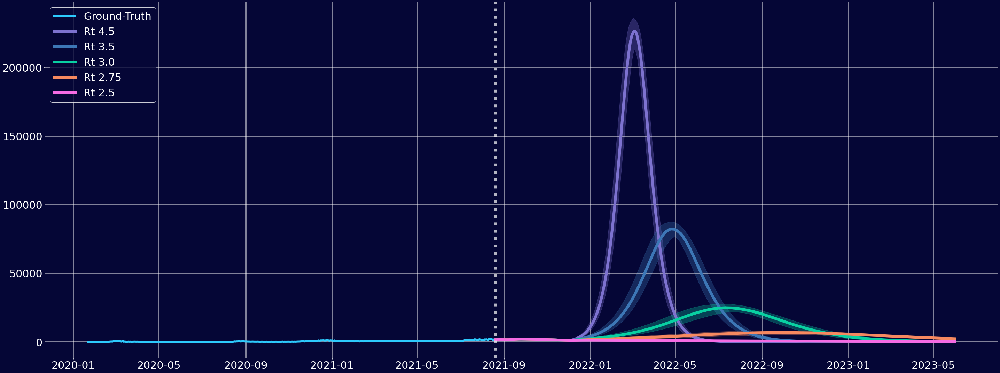

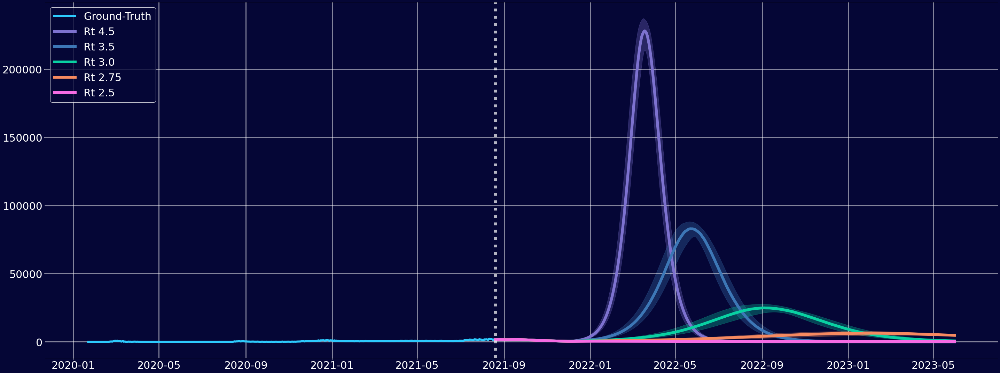

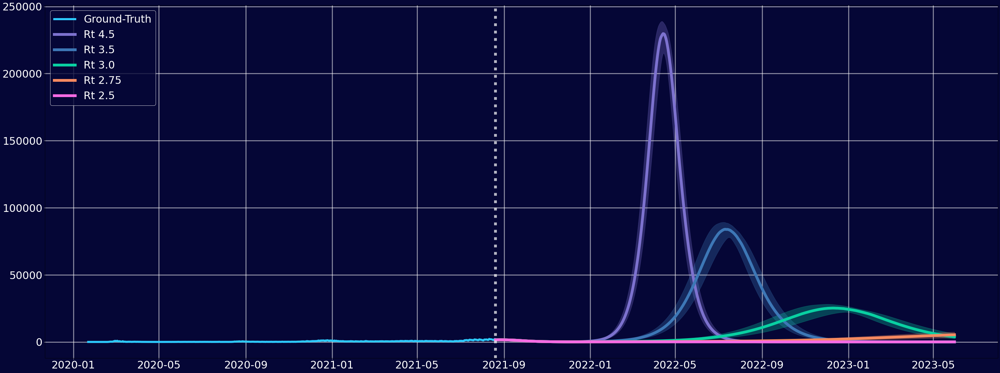

In [57]:
Rt_Plot('incidence',incidence,'Low')
Rt_Plot('incidence',incidence,'Base')
Rt_Plot('incidence',incidence,'High')

### 중증자

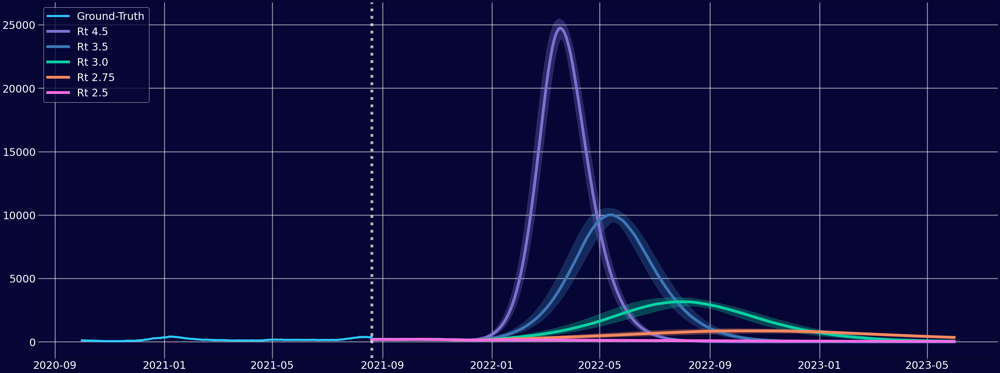

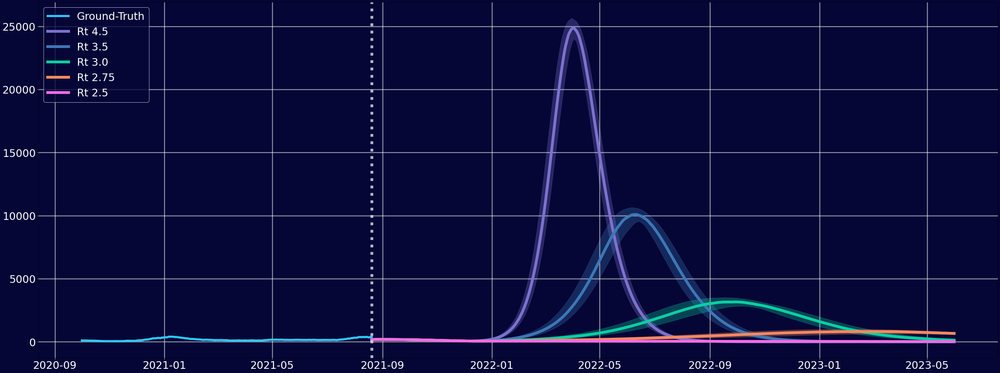

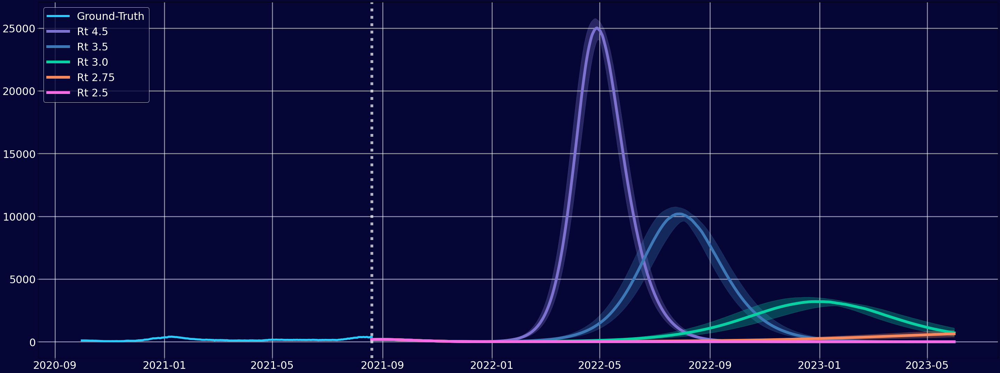

In [53]:
Rt_Plot('severity',severity,'Low')
Rt_Plot('severity',severity,'Base')
Rt_Plot('severity',severity,'High')

### 사망자

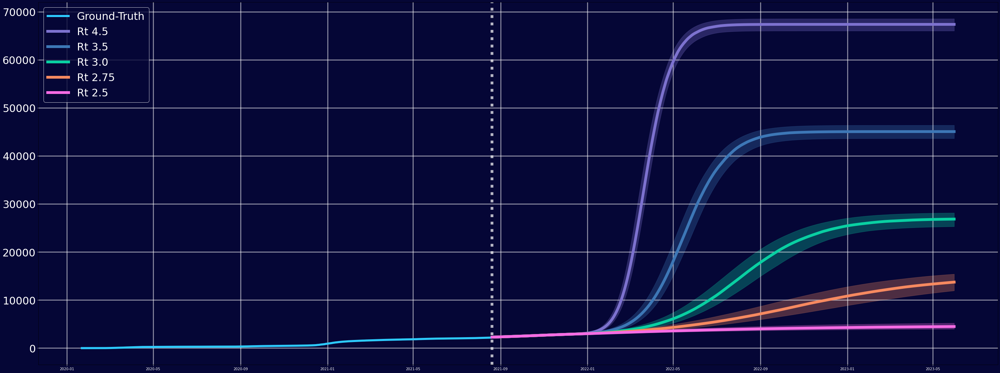

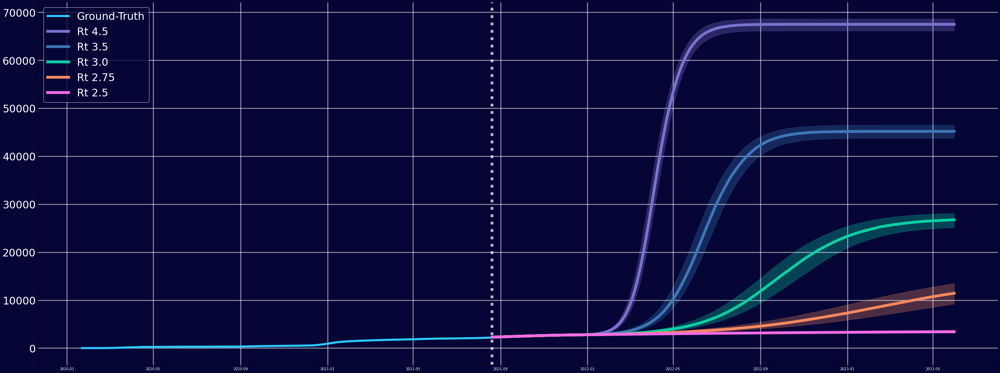

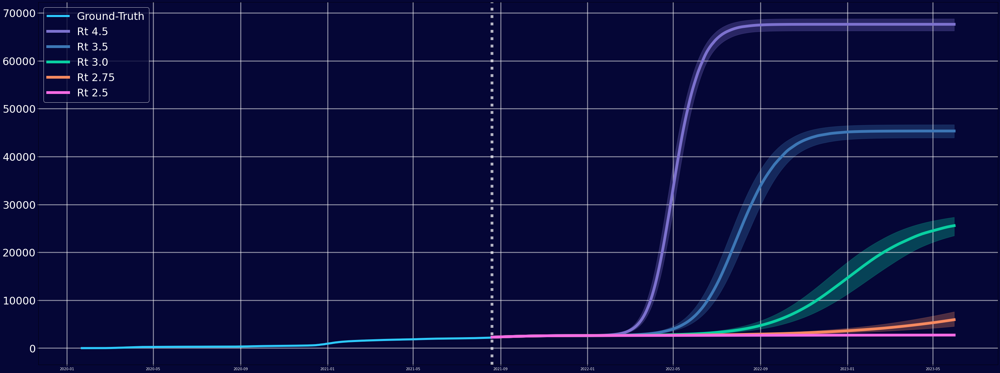

In [31]:
Rt_Plot('deaths',deaths,'Low')
Rt_Plot('deaths',deaths,'Base')
Rt_Plot('deaths',deaths,'High')

# 로그함수(상용로그) 적용

In [32]:
incidence

,Date,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,...,3.5_l_max,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max
0,2021-08-20,1543.435226,1543.435226,1543.435226,1474.295410,1624.920005,1474.295410,1624.920005,1474.295410,1624.920005,...,1624.920005,1543.435226,1.543435e+03,1.543435e+03,1474.295410,1624.920005,1.474295e+03,1624.920005,1.474295e+03,1.624920e+03
1,2021-08-21,1563.122933,1563.122933,1563.122933,1490.354135,1649.273319,1490.354135,1649.273319,1490.354135,1649.273319,...,1649.273319,1563.122933,1.563123e+03,1.563123e+03,1490.354135,1649.273319,1.490354e+03,1649.273319,1.490354e+03,1.649273e+03
2,2021-08-22,1579.098637,1579.098637,1579.098637,1502.433672,1669.530761,1502.433672,1669.530761,1502.433672,1669.530761,...,1669.530761,1579.098637,1.579099e+03,1.579099e+03,1502.433672,1669.530761,1.502434e+03,1669.530761,1.502434e+03,1.669531e+03
3,2021-08-23,1591.691931,1591.691931,1591.691931,1511.053041,1686.250123,1511.053041,1686.250123,1511.053041,1686.250123,...,1686.250123,1591.691931,1.591692e+03,1.591692e+03,1511.053041,1686.250123,1.511053e+03,1686.250123,1.511053e+03,1.686250e+03
4,2021-08-24,1600.847979,1600.847979,1600.847979,1516.746720,1700.100459,1516.746720,1700.100459,1516.746720,1700.100459,...,1700.100459,1600.847979,1.600848e+03,1.600848e+03,1516.746720,1700.100459,1.516747e+03,1700.100459,1.516747e+03,1.700100e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,2023-05-27,30.616776,135.232070,196.037660,14.340799,55.318139,70.201317,228.711321,116.021911,310.518851,...,0.490840,0.000003,6.928428e-07,3.043108e-07,0.000002,0.000007,3.403313e-07,0.000002,1.531598e-07,6.684015e-07
646,2023-05-28,30.564737,134.877879,195.173021,14.304688,55.264506,69.966049,228.237819,115.450445,309.498681,...,0.474135,0.000003,6.508238e-07,2.861358e-07,0.000002,0.000007,3.198082e-07,0.000001,1.441476e-07,6.285910e-07
647,2023-05-29,30.512783,134.515009,194.340220,14.268668,55.210907,69.731547,227.764995,114.881735,308.481315,...,0.457998,0.000003,6.113860e-07,2.690668e-07,0.000001,0.000007,3.005520e-07,0.000001,1.356837e-07,5.911757e-07
648,2023-05-30,30.460913,134.147931,193.524100,14.232737,55.157342,69.497807,227.292851,114.315768,307.466747,...,0.442411,0.000003,5.743702e-07,2.530343e-07,0.000001,0.000006,2.824824e-07,0.000001,1.277328e-07,5.560102e-07


In [33]:
# # StandardScaler객체 생성
# scaler = StandardScaler()
# test = incidence.copy()
# test.drop(['Date'], axis=1, inplace=True)

# # StandardScaler 로 데이터 셋 변환 .fit( ) 과 .transform( ) 호출
# scaler.fit(test)
# test_scaled = scaler.transform(test)

# # transform( )시 scale 변환된 데이터 셋이 numpy ndarry로 반환되어 이를 DataFrame으로 변환
# test_df_scaled = pd.DataFrame(data=test_scaled,columns = incidence.columns())

# test_df_scaled['Date'] = incidence['Date']

# test_df_scaled

In [34]:
## 확진자 표준화 - 상용로그 적용

scaler = MinMaxScaler()
i_test = incidence.copy()
i_test.drop(['Date'], axis=1, inplace=True)
# test = test**3
# test[:] = np.log(test[:])    
# test[:] = scaler.fit_transform(test[:])
# test = test**5
i_test = (i_test - np.min(i_test))/np.ptp(i_test)
i_test = i_test*75
i_test = i_test+1
i_test = np.log10(i_test)
# test[:] = np.log10(test[:])    
# test = test+1
i_test['Date'] = incidence['Date']
i_test

,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,2.75_h,...,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max,Date
0,0.168752,0.159092,0.153487,0.163833,0.173969,0.158655,0.157999,0.154426,0.150388,0.166456,...,1.715533e-01,1.715533e-01,1.715533e-01,1.651578e-01,1.789718e-01,1.651578e-01,1.789718e-01,1.651578e-01,1.789718e-01,2021-08-20
1,0.170568,0.160949,0.155368,0.165331,0.176187,0.160171,0.160300,0.155958,0.152730,0.168282,...,1.733573e-01,1.733573e-01,1.733573e-01,1.666517e-01,1.811646e-01,1.666517e-01,1.811646e-01,1.666517e-01,1.811646e-01,2021-08-21
2,0.172036,0.162450,0.156888,0.166455,0.178024,0.161308,0.162204,0.157106,0.154668,0.169757,...,1.748158e-01,1.748158e-01,1.748158e-01,1.677720e-01,1.829802e-01,1.677720e-01,1.829802e-01,1.677720e-01,1.829802e-01,2021-08-22
3,0.173189,0.163629,0.158082,0.167255,0.179533,0.162118,0.163770,0.157923,0.156261,0.170917,...,1.759620e-01,1.759620e-01,1.759620e-01,1.685696e-01,1.844730e-01,1.685696e-01,1.844730e-01,1.685696e-01,1.844730e-01,2021-08-23
4,0.174026,0.164484,0.158949,0.167783,0.180780,0.162652,0.165063,0.158462,0.157577,0.171758,...,1.767934e-01,1.767934e-01,1.767934e-01,1.690957e-01,1.857057e-01,1.690957e-01,1.857057e-01,1.690957e-01,1.857057e-01,2021-08-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,0.000028,0.000198,0.000453,0.000020,0.000029,0.000128,0.000258,0.000309,0.000554,0.421021,...,1.037300e-10,2.088376e-11,9.041631e-12,4.996971e-11,2.252295e-10,1.019612e-11,4.590382e-11,4.484026e-12,1.982435e-11,2023-05-27
646,0.000021,0.000150,0.000335,0.000015,0.000022,0.000096,0.000193,0.000232,0.000415,0.422010,...,7.525062e-11,1.515643e-11,6.564370e-12,3.624135e-11,1.635137e-10,7.398706e-12,3.333285e-11,3.255570e-12,1.439799e-11,2023-05-28
647,0.000014,0.000101,0.000222,0.000010,0.000015,0.000064,0.000129,0.000154,0.000276,0.422990,...,4.854164e-11,9.780981e-12,4.237737e-12,2.337250e-11,1.055540e-10,4.774096e-12,2.152225e-11,2.101945e-12,9.298142e-12,2023-05-29
648,0.000007,0.000051,0.000111,0.000005,0.000007,0.000032,0.000064,0.000077,0.000138,0.423962,...,2.349256e-11,4.735523e-12,2.052475e-12,1.130896e-11,5.112122e-11,2.311107e-12,1.042563e-11,1.018233e-12,4.504952e-12,2023-05-30


In [35]:
## 중증자 표준화 - 상용로그 적용

scaler = MinMaxScaler()
s_test = severity.copy()
s_test.drop(['Date'], axis=1, inplace=True)
# test = test**3
# test[:] = np.log(test[:])    
# test[:] = scaler.fit_transform(test[:])
# test = test**5
s_test = (s_test - np.min(s_test))/np.ptp(s_test)
s_test = s_test*500
s_test = s_test+1
s_test = np.log10(s_test)
# test[:] = np.log10(test[:])    
# test = test+1
s_test['Date'] = severity['Date']
s_test

,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,2.75_h,...,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max,Date
0,0.641575,0.613511,0.594455,0.639097,0.642342,0.623746,0.594871,0.610221,0.570237,0.628215,...,6.492804e-01,6.492805e-01,6.492805e-01,6.428960e-01,6.560675e-01,6.428960e-01,6.560677e-01,6.428961e-01,6.560677e-01,2021-08-20
1,0.645785,0.618001,0.599145,0.642701,0.647308,0.627479,0.600407,0.614072,0.576094,0.632556,...,6.534169e-01,6.534170e-01,6.534170e-01,6.464685e-01,6.608800e-01,6.464685e-01,6.608801e-01,6.464686e-01,6.608802e-01,2021-08-21
2,0.649471,0.621929,0.603247,0.645788,0.651763,0.630677,0.605368,0.617369,0.581339,0.636356,...,6.570391e-01,6.570392e-01,6.570392e-01,6.495297e-01,6.651992e-01,6.495298e-01,6.651994e-01,6.495298e-01,6.651994e-01,2021-08-22
3,0.652693,0.625361,0.606830,0.648423,0.655767,0.633404,0.609821,0.620182,0.586044,0.639676,...,6.602056e-01,6.602057e-01,6.602057e-01,6.521420e-01,6.690818e-01,6.521420e-01,6.690819e-01,6.521420e-01,6.690819e-01,2021-08-23
4,0.655503,0.628353,0.609952,0.650654,0.659367,0.635713,0.613820,0.622562,0.590268,0.642571,...,6.629676e-01,6.629677e-01,6.629677e-01,6.543535e-01,6.725731e-01,6.543536e-01,6.725732e-01,6.543536e-01,6.725733e-01,2021-08-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,0.000232,0.001753,0.004015,0.000164,0.000236,0.001134,0.002130,0.002730,0.004456,1.115230,...,1.407212e-07,3.362930e-08,1.536757e-08,9.679808e-08,2.083949e-07,2.287318e-08,4.926843e-08,1.042690e-08,2.243519e-08,2023-05-27
646,0.000174,0.001314,0.002996,0.000123,0.000177,0.000849,0.001597,0.002044,0.003342,1.116961,...,1.025624e-07,2.450884e-08,1.120013e-08,7.054345e-08,1.518938e-07,1.666892e-08,3.590857e-08,7.598601e-09,1.635135e-08,2023-05-28
647,0.000116,0.000875,0.001985,0.000082,0.000118,0.000566,0.001065,0.001361,0.002228,1.118667,...,6.646221e-08,1.588132e-08,7.257700e-09,4.570941e-08,9.843528e-08,1.080060e-08,2.326943e-08,4.923470e-09,1.059585e-08,2023-05-29
648,0.000058,0.000437,0.000976,0.000041,0.000059,0.000282,0.000532,0.000679,0.001114,1.120396,...,3.230974e-08,7.720097e-09,3.528154e-09,2.221914e-08,4.785562e-08,5.250021e-09,1.131215e-08,2.393217e-09,5.150984e-09,2023-05-30


In [36]:
## 사망자 표준화 - 상용로그 적용

scaler = MinMaxScaler()
d_test = deaths.copy()
d_test.drop(['Date'], axis=1, inplace=True)
# test = test**3
# test[:] = np.log(test[:])    
# test[:] = scaler.fit_transform(test[:])
# test = test**5
d_test = (d_test - np.min(d_test))/np.ptp(d_test)
d_test = d_test*10
d_test = d_test+1
d_test = np.log10(d_test)
# test[:] = np.log10(test[:])    
# test = test+1
d_test['Date'] = deaths['Date']
d_test

,2.5_h,2.5_b,2.5_l,2.5_h_min,2.5_h_max,2.5_b_min,2.5_b_max,2.5_l_min,2.5_l_max,2.75_h,...,4.5_h,4.5_b,4.5_l,4.5_h_min,4.5_h_max,4.5_b_min,4.5_b_max,4.5_l_min,4.5_l_max,Date
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2021-08-20
1,0.000373,0.000373,0.000373,0.000368,0.000379,0.000368,0.000379,0.000368,0.000379,0.000373,...,0.000373,0.000373,0.000373,0.000368,0.000379,0.000368,0.000379,0.000368,0.000379,2021-08-21
2,0.000745,0.000745,0.000745,0.000734,0.000758,0.000734,0.000758,0.000734,0.000758,0.000745,...,0.000745,0.000745,0.000745,0.000734,0.000758,0.000734,0.000758,0.000734,0.000758,2021-08-22
3,0.001116,0.001116,0.001116,0.001098,0.001136,0.001098,0.001136,0.001098,0.001136,0.001116,...,0.001116,0.001116,0.001116,0.001098,0.001136,0.001098,0.001136,0.001098,0.001136,2021-08-23
4,0.001485,0.001485,0.001485,0.001460,0.001513,0.001460,0.001513,0.001460,0.001513,0.001485,...,0.001485,0.001485,0.001485,0.001460,0.001513,0.001460,0.001513,0.001460,0.001513,2021-08-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,0.028207,0.068270,0.124523,0.024790,0.033175,0.054345,0.088368,0.098672,0.158850,0.186566,...,1.034397,1.033747,1.032990,1.026159,1.041387,1.025510,1.040757,1.024807,1.040073,2023-05-27
646,0.028215,0.068299,0.124583,0.024795,0.033188,0.054365,0.088425,0.098704,0.158911,0.187496,...,1.034397,1.033747,1.032990,1.026159,1.041387,1.025510,1.040757,1.024807,1.040073,2023-05-28
647,0.028223,0.068327,0.124643,0.024800,0.033201,0.054385,0.088481,0.098735,0.158973,0.188428,...,1.034397,1.033747,1.032990,1.026159,1.041387,1.025510,1.040757,1.024807,1.040073,2023-05-29
648,0.028231,0.068355,0.124703,0.024805,0.033214,0.054404,0.088537,0.098766,0.159034,0.189361,...,1.034397,1.033747,1.032990,1.026159,1.041387,1.025510,1.040757,1.024807,1.040073,2023-05-30


In [37]:
# np.log(3,1.5)

In [38]:
math.log(3, 1.5)


2.709511291351455

In [39]:
## Rt plot
def Log_Rt_Plot(x,y,value):
    v = ''
    if value =='Low':
        v = 'l'
    elif value == 'Base':
        v = 'b'
    else:
        v = 'h'
    
    if x == 'incidence':
        ground_truth = data_case
        column = 'Confirmed'
        plt_start_date = start_date
        offset = 0
        
    elif x == 'deaths':
        ground_truth = data_case
        column = 'Cum_Deaths'
        plt_start_date = start_date
        offset = aug20_cum_deaths

    else:
        ground_truth = old_severity
        column = 'Severity'
        plt_start_date = sev_start_date
        offset = 0

    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
#     plt.ylim(y_lim)
    #############################################################
   
    
    ################ Ground Truth #######################################
    plt.plot(ground_truth['tDate'], ground_truth[column],color = '#2dcafd',  linewidth = 6)

    
    ################ Rt[0] Data #######################################
    plt.plot(y['Date'], np.log(y[str(Rt[0])+'_'+v])*1000+offset, color ='#f68960', linewidth = 8)
    plt.fill_between(y['Date'], np.log(y[str(Rt[0])+'_'+v+'_min'])*1000+offset,np.log(y[str(Rt[0])+'_'+v+'_max'])*1000+offset, color = '#f68960',alpha=0.2)
    
    
    ################ Rt[1] Data #######################################
    plt.plot(y['Date'], np.log(y[str(Rt[1])+'_'+v])*1000+offset, color ='#f56be4', linewidth = 8)
    plt.fill_between(y['Date'], np.log(y[str(Rt[1])+'_'+v+'_min'])*1000+offset,np.log(y[str(Rt[1])+'_'+v+'_max'])*1000+offset, color = '#f56be4',alpha=0.2)
    
    
    ################ Rt[2] Data #######################################
    plt.plot(y['Date'], np.log(y[str(Rt[2])+'_'+v])*1000+offset, color ='#09d0a2', linewidth = 8)
    plt.fill_between(y['Date'], np.log(y[str(Rt[2])+'_'+v+'_min'])*1000+offset,np.log(y[str(Rt[2])+'_'+v+'_max'])*1000+offset, color = '#09d0a2',alpha=0.2)
    
    
    ################ Rt[3] Data #######################################
    plt.plot(y['Date'], np.log(y[str(Rt[3])+'_'+v])*1000+offset, color ='#3d77b6', linewidth = 8)
    plt.fill_between(y['Date'], np.log(y[str(Rt[3])+'_'+v+'_min'])*1000+offset,np.log(y[str(Rt[3])+'_'+v+'_max'])*1000+offset, color = '#3d77b6',alpha=0.2)
    
    
    ################ Rt[4] Data #######################################
    plt.plot(y['Date'], np.log(y[str(Rt[4])+'_'+v])*1000+offset, color ='#7d72cf', linewidth = 8)
    plt.fill_between(y['Date'], np.log(y[str(Rt[4])+'_'+v+'_min'])*1000+offset,np.log(y[str(Rt[4])+'_'+v+'_max'])*1000+offset, color = '#7d72cf',alpha=0.2)

    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth','Rt '+str(Rt[0]),'Rt '+str(Rt[1]),'Rt '+str(Rt[2]),'Rt '+str(Rt[3]),'Rt '+str(Rt[4])],fontsize = 30,loc = 'upper left', edgecolor = 'w')


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
    plt.title('R counter '+value+' - '+column+' (use log10)',fontsize=50)
#     plt.suptitle(file_name, y=1, fontsize=30)
    plt.xticks([plt_start_date,pre_date,end_date],[str(plt_start_date)[:10],str(pre_date)[:10],str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
#     plt.savefig("../figures/I/"+file_name+".png",dpi=300)
    plt.show()

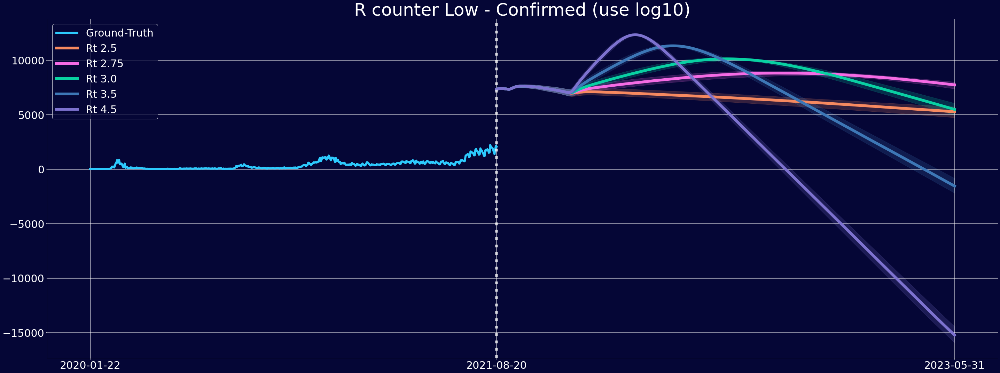

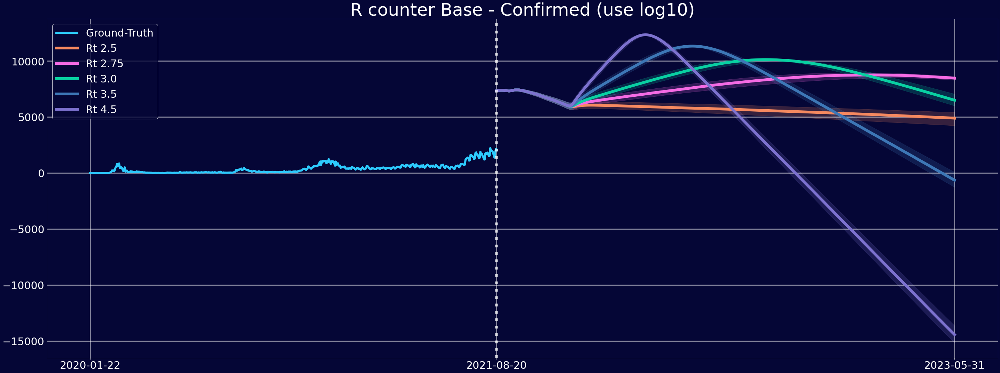

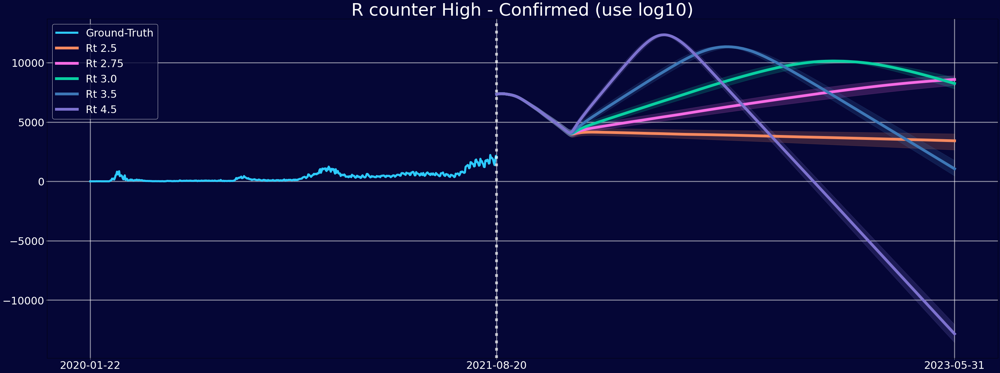

In [40]:
Log_Rt_Plot('incidence',incidence,'Low')
Log_Rt_Plot('incidence',incidence,'Base')
Log_Rt_Plot('incidence',incidence,'High')

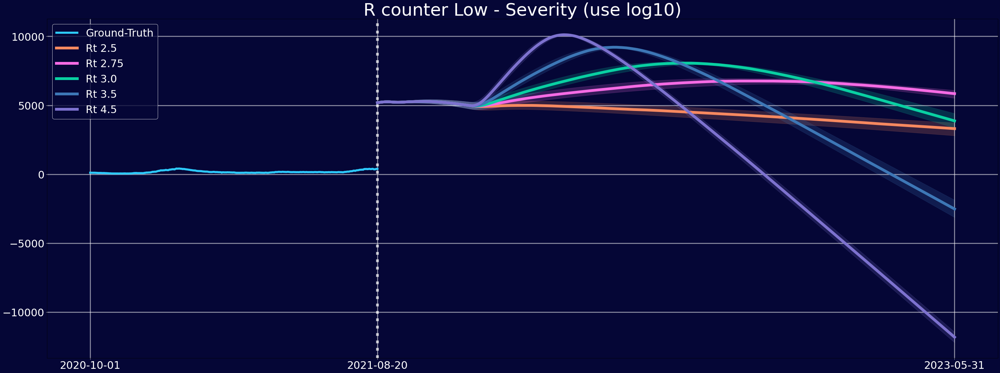

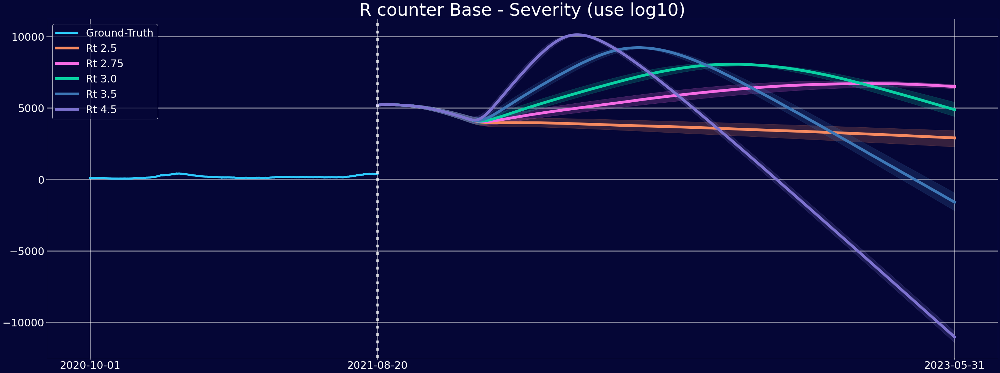

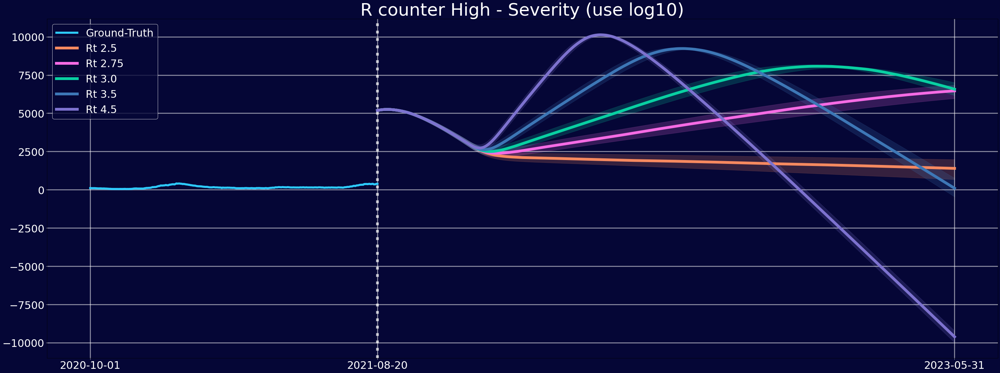

In [41]:
Log_Rt_Plot('severity',severity,'Low')
Log_Rt_Plot('severity',severity,'Base')
Log_Rt_Plot('severity',severity,'High')

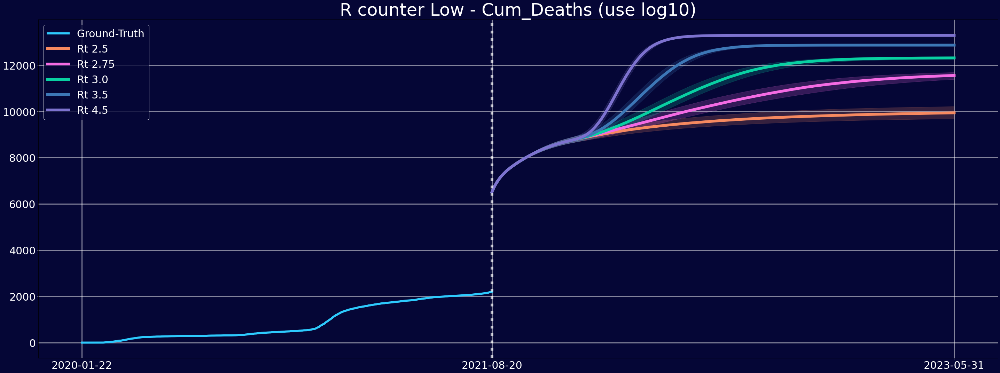

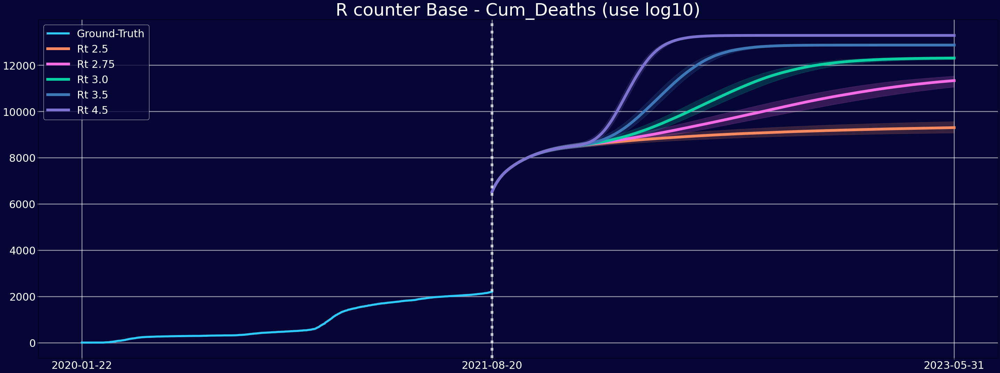

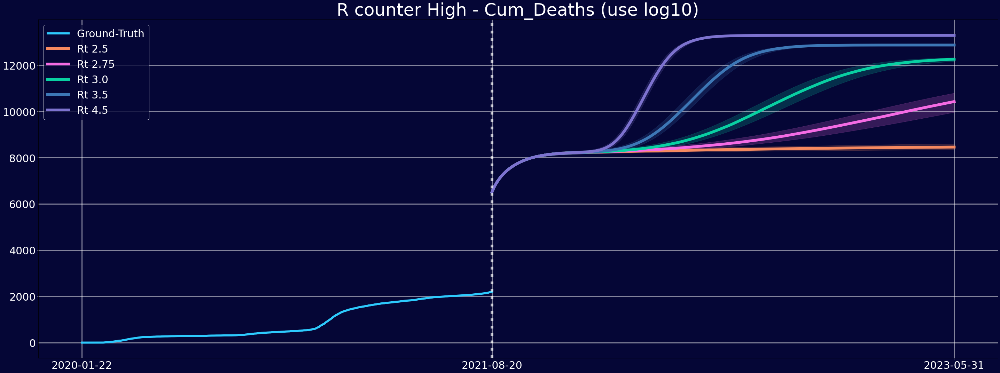

In [42]:
Log_Rt_Plot('deaths',deaths,'Low')
Log_Rt_Plot('deaths',deaths,'Base')
Log_Rt_Plot('deaths',deaths,'High')

In [43]:
## Rt plot
def test_Log_Rt_Plot(x,y,value):
    a1 = 1.0
    a2 = 1.0
    a3 = 1.0
    a4 = 1.0
    
    v = ''
    if value =='Low':
        v = 'l'
    elif value == 'Base':
        v = 'b'
    else:
        v = 'h'
    
    if x == 'incidence':
        ground_truth = data_case
        column = 'Confirmed'
        plt_start_date = start_date
        offset = 0
        n = 10000
        
    elif x == 'deaths':
        ground_truth = data_case
        column = 'Cum_Deaths'
        plt_start_date = start_date
        offset = aug20_cum_deaths
        n = 10000
    else:
        ground_truth = old_severity
        column = 'Severity'
        plt_start_date = sev_start_date
        offset = 0
        n = 500
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
#     plt.ylim(y_lim)
    #############################################################
   
    
    ################ Ground Truth #######################################
    plt.plot(ground_truth['tDate'], ground_truth[column],color = '#2dcafd',  linewidth = 6)

    
    ################ Rt[4] Data #######################################
    plt.plot(y['Date'], y[str(Rt[4])+'_'+v]*n*a4+offset, color ='#7d72cf', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[4])+'_'+v+'_min']*n*a4+offset,y[str(Rt[4])+'_'+v+'_max']*n*a4+offset, color = '#7d72cf',alpha=0.2)

    
    ################ Rt[3] Data #######################################
    plt.plot(y['Date'], y[str(Rt[3])+'_'+v]*n*a3+offset, color ='#3d77b6', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[3])+'_'+v+'_min']*n*a3+offset,y[str(Rt[3])+'_'+v+'_max']*n*a3+offset, color = '#3d77b6',alpha=0.2)
    
    ################ Rt[2] Data #######################################
    plt.plot(y['Date'], y[str(Rt[2])+'_'+v]*n*a2+offset, color ='#09d0a2', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[2])+'_'+v+'_min']*n*a2+offset,y[str(Rt[2])+'_'+v+'_max']*n*a2+offset, color = '#09d0a2',alpha=0.2)
    
    ################ Rt[1] Data #######################################
    plt.plot(y['Date'], y[str(Rt[1])+'_'+v]*n*a1+offset, color ='#f56be4', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[1])+'_'+v+'_min']*n*a1+offset,y[str(Rt[1])+'_'+v+'_max']*n*a1+offset, color = '#f56be4',alpha=0.2)
    
    
    ################ Rt[0] Data #######################################
    plt.plot(y['Date'], y[str(Rt[0])+'_'+v]*n+offset, color ='#f68960', linewidth = 8)
    plt.fill_between(y['Date'], y[str(Rt[0])+'_'+v+'_min']*n+offset,y[str(Rt[0])+'_'+v+'_max']*n+offset, color = '#f68960',alpha=0.2)
    
    
    
    
    
    
    
    
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth','Rt '+str(Rt[0]),'Rt '+str(Rt[1]),'Rt '+str(Rt[2]),'Rt '+str(Rt[3]),'Rt '+str(Rt[4])],fontsize = 30,loc = 'upper left', edgecolor = 'w')


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
    plt.title('R counter '+value+' - '+column+' (use log10)',fontsize=50)
#     plt.suptitle(file_name, y=1, fontsize=30)
    plt.xticks([plt_start_date,pre_date,end_date],[str(plt_start_date)[:10],str(pre_date)[:10],str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
#     plt.savefig("../figures/I/"+file_name+".png",dpi=300)
    plt.show()

In [44]:
# a = np.log10(incidence.loc[test['4.5_l'].argmax(),'4.5_l'])
# a

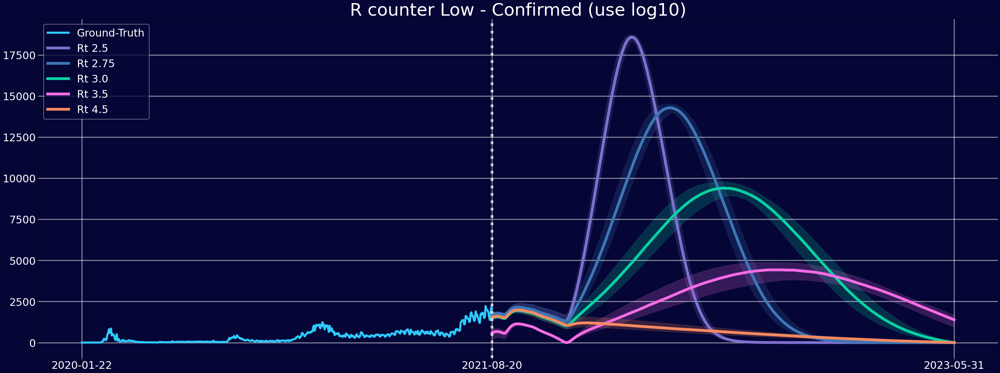

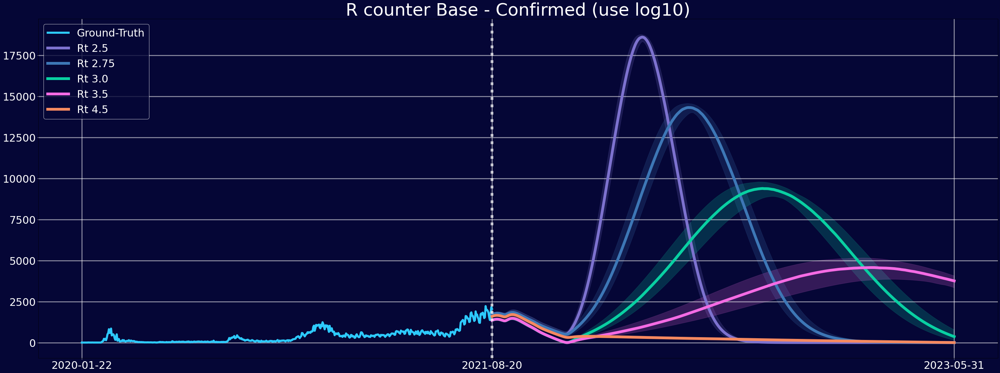

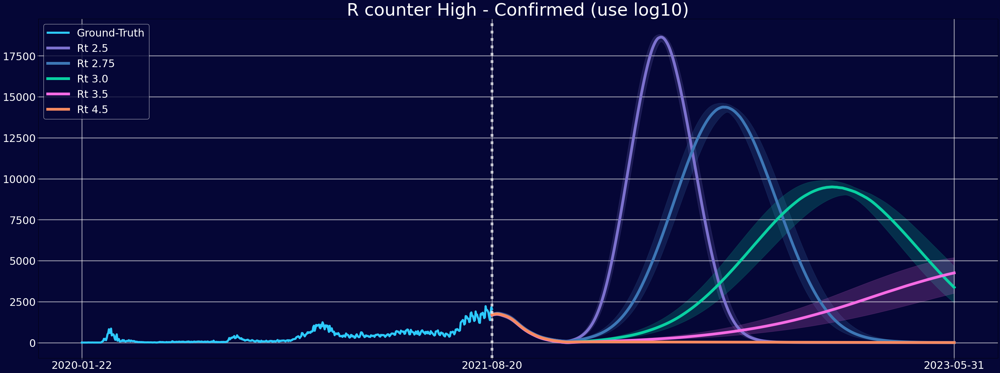

In [45]:
test_Log_Rt_Plot('incidence',i_test,'Low')
test_Log_Rt_Plot('incidence',i_test,'Base')
test_Log_Rt_Plot('incidence',i_test,'High')

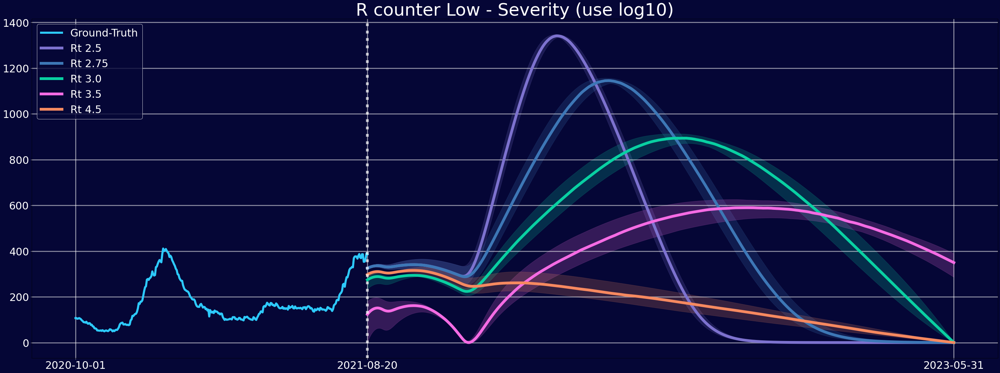

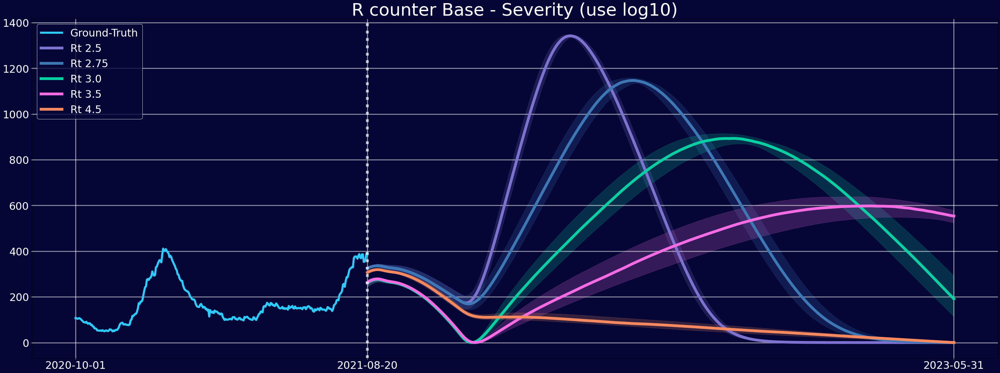

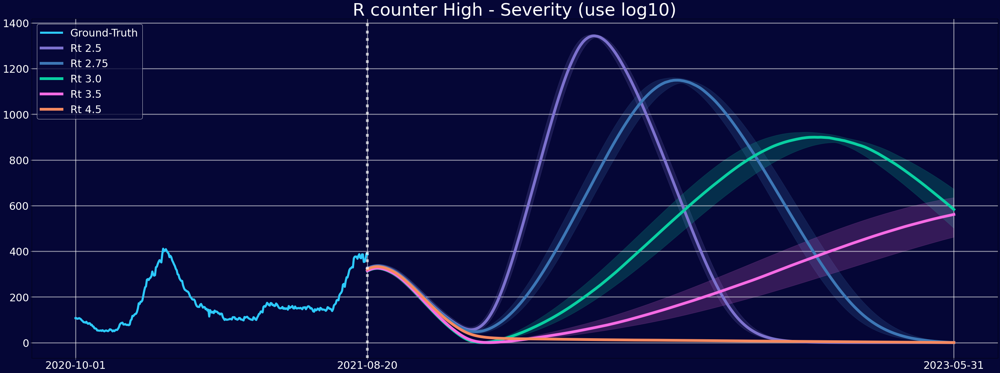

In [46]:
test_Log_Rt_Plot('severity',s_test,'Low')
test_Log_Rt_Plot('severity',s_test,'Base')
test_Log_Rt_Plot('severity',s_test,'High')

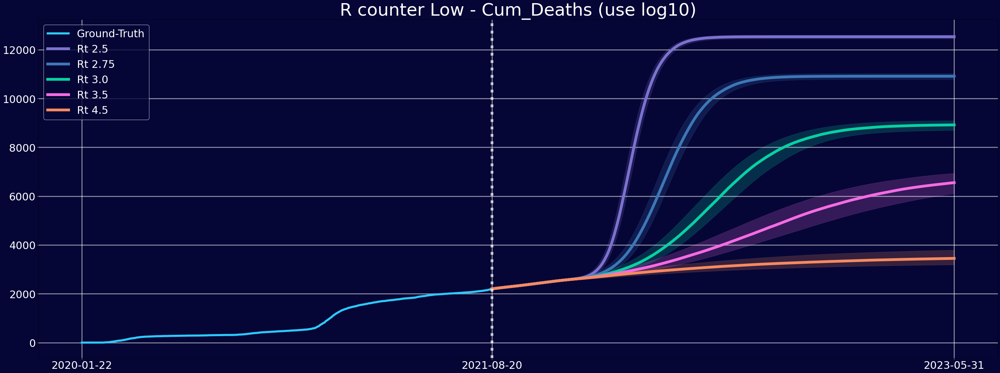

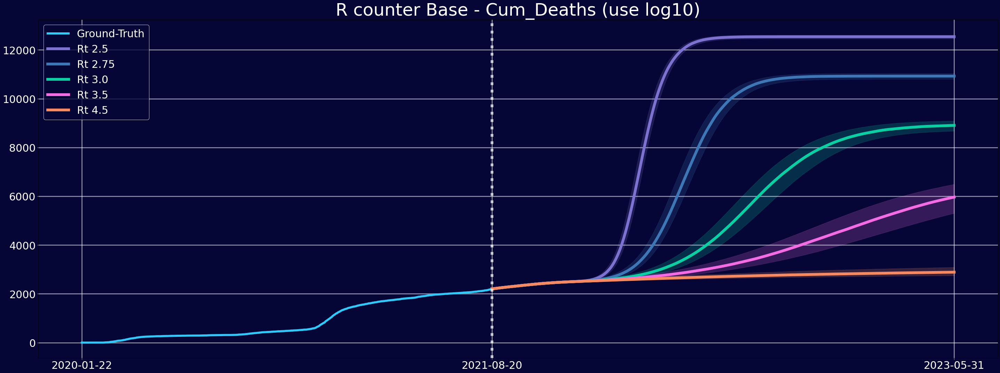

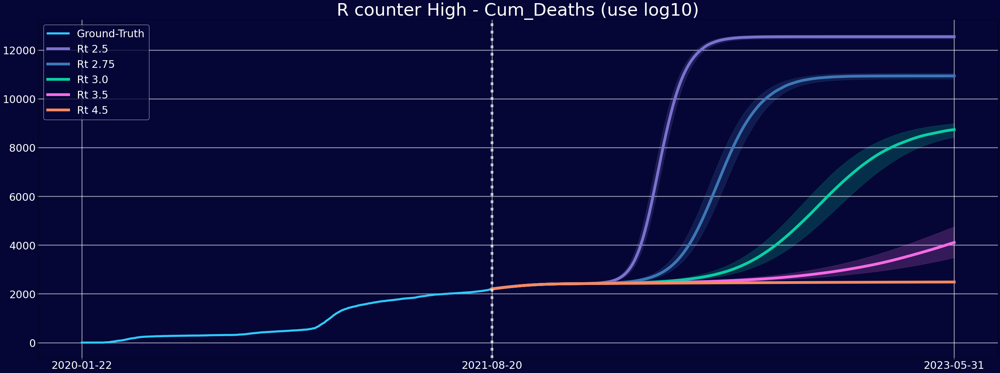

In [47]:
test_Log_Rt_Plot('deaths',d_test,'Low')
test_Log_Rt_Plot('deaths',d_test,'Base')
test_Log_Rt_Plot('deaths',d_test,'High')